In [1]:
import pandas as pd
from scipy.stats import mode
import h3
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

from sklearn.ensemble import RandomForestClassifier
import shap
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

In [78]:
data = pd.read_csv('global_fishing_data_1.csv').drop('Unnamed: 0',axis=1)

In [2]:

display(data.head(3))
display(data.isna().sum())
display(data.info(verbose=True))

,mmsi,timestamp,distance_from_shore,distance_from_port,speed,course,lat,lon,is_fishing,source,...,hexagon_coordi_7,hexagon_coordi_7_3,course_hex_level_3_avg,is_fishing_hex_level_3_avg,ship_type_hex_level_3_avg,speed_hex_level_3_avg,course_hex_level_7_avg,is_fishing_hex_level_7_avg,ship_type_hex_level_7_avg,speed_hex_level_7_avg
0,1.252340e+12,2015-01-01 05:08:23,0.0,0.0,0.0,128.0,52.458717,4.581316,0.0,gfw,...,87196820affffff,831968fffffffff,120.599998,0.001737,trawlers,0.358636,120.599998,0.0,trawlers,0.007767
1,1.252340e+12,2015-01-01 05:20:34,0.0,0.0,0.0,128.0,52.458733,4.581316,0.0,gfw,...,87196820affffff,831968fffffffff,120.599998,0.001737,trawlers,0.358636,120.599998,0.0,trawlers,0.007767
2,1.252340e+12,2015-01-01 05:32:53,0.0,0.0,0.0,128.0,52.458698,4.581267,0.0,gfw,...,87196820affffff,831968fffffffff,120.599998,0.001737,trawlers,0.358636,120.599998,0.0,trawlers,0.007767


mmsi                          0
timestamp                     0
distance_from_shore           0
distance_from_port            0
speed                         2
course                        2
lat                           0
lon                           0
is_fishing                    0
source                        0
ship_type                     0
hour                          0
day                           0
month                         0
year                          0
hexagon_coordi_7              0
hexagon_coordi_7_3            0
course_hex_level_3_avg        0
is_fishing_hex_level_3_avg    0
ship_type_hex_level_3_avg     0
speed_hex_level_3_avg         0
course_hex_level_7_avg        1
is_fishing_hex_level_7_avg    0
ship_type_hex_level_7_avg     0
speed_hex_level_7_avg         1
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 553855 entries, 0 to 553854
Data columns (total 25 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   mmsi                        553855 non-null  float64
 1   timestamp                   553855 non-null  object 
 2   distance_from_shore         553855 non-null  float64
 3   distance_from_port          553855 non-null  float64
 4   speed                       553853 non-null  float64
 5   course                      553853 non-null  float64
 6   lat                         553855 non-null  float64
 7   lon                         553855 non-null  float64
 8   is_fishing                  553855 non-null  float64
 9   source                      553855 non-null  object 
 10  ship_type                   553855 non-null  object 
 11  hour                        553855 non-null  int64  
 12  day                         553855 non-null  int64  
 13  month         

None

In [211]:
data.set_index('mmsi',inplace=True)

In [212]:

data.columns

Index(['timestamp', 'distance_from_shore', 'distance_from_port', 'speed',
       'course', 'lat', 'lon', 'is_fishing', 'source', 'ship_type', 'hour',
       'day', 'month', 'year', 'hexagon_coordi_7', 'hexagon_coordi_7_3',
       'course_hex_level_3_avg', 'is_fishing_hex_level_3_avg',
       'ship_type_hex_level_3_avg', 'speed_hex_level_3_avg',
       'course_hex_level_7_avg', 'is_fishing_hex_level_7_avg',
       'ship_type_hex_level_7_avg', 'speed_hex_level_7_avg'],
      dtype='object')

In [213]:
data.drop(['timestamp','hexagon_coordi_7','hexagon_coordi_7_3','is_fishing_hex_level_3_avg','is_fishing_hex_level_7_avg','lat','lon'],axis=1,inplace=True)

In [214]:

data = data.query('is_fishing == 0 or is_fishing == 1')

In [2]:
target_col = 'is_fishing'

In [216]:
data.groupby('ship_type')[['is_fishing']].mean()

,is_fishing
ship_type,
drifting_longlines,0.634541
fixed_gear,0.263626
pole_and_line,0.207782
purse_seines,0.121902
trawlers,0.354029
trollers,0.384595
unknown,0.396557


In [217]:
categorical_columns = ['source','ship_type_hex_level_3_avg','ship_type_hex_level_7_avg'] #ship_type ommitted for experiment

In [218]:

data = pd.get_dummies(data, columns=categorical_columns)

In [219]:
# Dictionary to hold training and test sets for each ship type
data_splits = {}
ship_types = data['ship_type'].unique().tolist() + ['all_data']

for ship in ship_types:
    if ship != 'all_data':
        data_ship = data[data['ship_type'] == ship].drop('ship_type', axis=1)
    else:
        data_ship = pd.get_dummies(data, columns=['ship_type'])
        #data_ship = data.drop('ship_type', axis=1)
    
    X_ship = data_ship.drop(target_col, axis=1)
    y_ship = data_ship[target_col]
    
    X_train, X_test, y_train, y_test = train_test_split(X_ship, y_ship, test_size=0.2, random_state=42)
    data_splits[ship] = (X_train, X_test, y_train, y_test)


In [220]:
rf_params = {'n_estimators': 500, 'max_depth': 5, 'random_state': 2024}


models = {}
for ship, splits in data_splits.items():
    X_train, X_test, y_train, y_test = splits
    model = RandomForestClassifier(**rf_params)
    model.fit(X_train, y_train)
    models[ship] = model



In [14]:

results = {}
for ship, model in models.items():
    # Retrieve the training and test sets
    X_train, X_test, y_train, y_test = data_splits[ship]

    # Predictions for test set
    test_predictions = model.predict(X_test)
    test_probs = model.predict_proba(X_test)[:, 1]  # probabilities for ROC AUC

    # Predictions for training set
    train_predictions = model.predict(X_train)
    train_probs = model.predict_proba(X_train)[:, 1]  # probabilities for ROC AUC

    # Store results for both training and test sets
    results[ship] = {
        'train_accuracy': accuracy_score(y_train, train_predictions),
        'test_accuracy': accuracy_score(y_test, test_predictions),
        'train_precision': precision_score(y_train, train_predictions),
        'test_precision': precision_score(y_test, test_predictions),
        'train_recall': recall_score(y_train, train_predictions),
        'test_recall': recall_score(y_test, test_predictions),
        'train_f1_score': f1_score(y_train, train_predictions),     
        'test_f1_score': f1_score(y_test, test_predictions),
        'test_roc_auc': roc_auc_score(y_test, test_probs),
        'train_roc_auc': roc_auc_score(y_train, train_probs),   
    }

# Convert results dictionary to DataFrame
df_results = pd.DataFrame.from_dict(results, orient='index')

# Optionally, reset the index to make 'ship' a column and improve readability
df_results.reset_index(inplace=True)
df_results.rename(columns={'index': 'ship'}, inplace=True)

# Display the DataFrame
display(df_results)


,ship,train_accuracy,test_accuracy,train_precision,test_precision,train_recall,test_recall,train_f1_score,test_f1_score,test_roc_auc,train_roc_auc
0,trawlers,0.907455,0.905419,0.838113,0.835230,0.915434,0.912864,0.875069,0.872323,0.959469,0.961581
1,drifting_longlines,0.870956,0.867434,0.844431,0.839472,0.976909,0.976593,0.905852,0.902856,0.920909,0.921733
2,trollers,0.904361,0.905379,0.851910,0.841935,0.912354,0.915789,0.881096,0.877311,0.960784,0.963353
3,unknown,0.900535,0.900144,0.818636,0.817157,0.962609,0.962981,0.884804,0.884097,0.963428,0.963678
4,pole_and_line,0.966012,0.965087,0.960976,0.932886,0.874260,0.885350,0.915569,0.908497,0.988140,0.994631
5,fixed_gear,0.891732,0.891608,0.764644,0.768160,0.852951,0.836967,0.806387,0.801089,0.941508,0.940323
6,purse_seines,0.903620,0.905472,0.959144,0.950820,0.223583,0.216822,0.362633,0.353120,0.934813,0.932885
7,all_data,0.873306,0.873776,0.809066,0.810550,0.944615,0.943840,0.871602,0.872132,0.939128,0.938832


In [31]:
data_splits['all_data'][0]['ship_type_drifting_longlines']

mmsi
2.774583e+14     True
7.783293e+13     True
7.783293e+13     True
6.347615e+13    False
1.217392e+14    False
                ...  
2.311543e+14    False
6.260384e+13     True
2.403066e+14     True
2.690503e+14    False
2.690503e+14    False
Name: ship_type_drifting_longlines, Length: 434781, dtype: bool

In [24]:
ship_features = ['ship_type_drifting_longlines','ship_type_fixed_gear', 'ship_type_pole_and_line','ship_type_purse_seines', 'ship_type_trawlers', 'ship_type_trollers','ship_type_unknown']

In [32]:
data_splits_2 = data_splits.copy()

In [33]:
models.items()

dict_items([('trawlers', RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024)), ('drifting_longlines', RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024)), ('trollers', RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024)), ('unknown', RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024)), ('pole_and_line', RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024)), ('fixed_gear', RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024)), ('purse_seines', RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024)), ('all_data', RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024))])

In [34]:

results_all_data = {}
for ship, _ in models.items():
    # Retrieve the training and test sets
    X_train, X_test, y_train, y_test = data_splits[ship]
    ship_feature = [feature for feature in ship_features if ship in feature]

    X_train[ship_features] = False
    X_test[ship_features] = False

    X_train[ship_feature] = True
    X_test[ship_feature] = True
    
    # Predictions for test set
    test_predictions = models['all_data'].predict(X_test)
    test_probs = models['all_data'].predict_proba(X_test)[:, 1]  # probabilities for ROC AUC

    # Predictions for training set
    train_predictions = models['all_data'].predict(X_train)
    train_probs = models['all_data'].predict_proba(X_train)[:, 1]  # probabilities for ROC AUC

    # Store results for both training and test sets
    results_all_data[ship] = {
        'train_accuracy': accuracy_score(y_train, train_predictions),
        'test_accuracy': accuracy_score(y_test, test_predictions),
        'train_precision': precision_score(y_train, train_predictions),
        'test_precision': precision_score(y_test, test_predictions),
        'train_recall': recall_score(y_train, train_predictions),
        'test_recall': recall_score(y_test, test_predictions),
        'train_f1_score': f1_score(y_train, train_predictions),     
        'test_f1_score': f1_score(y_test, test_predictions),
        'test_roc_auc': roc_auc_score(y_test, test_probs),
        'train_roc_auc': roc_auc_score(y_train, train_probs),   
    }

# Convert results dictionary to DataFrame
df_results_all_data = pd.DataFrame.from_dict(results_all_data, orient='index')

# Optionally, reset the index to make 'ship' a column and improve readability
df_results_all_data.reset_index(inplace=True)
df_results_all_data.rename(columns={'index': 'ship'}, inplace=True)

# Display the DataFrame
display(df_results_all_data)


,ship,train_accuracy,test_accuracy,train_precision,test_precision,train_recall,test_recall,train_f1_score,test_f1_score,test_roc_auc,train_roc_auc
0,trawlers,0.893671,0.893129,0.793227,0.793335,0.946374,0.943955,0.863059,0.862116,0.952129,0.954376
1,drifting_longlines,0.858763,0.854414,0.831193,0.825057,0.975952,0.976192,0.897774,0.894284,0.908405,0.909450
2,trollers,0.821041,0.826312,0.714333,0.709722,0.898581,0.896491,0.795933,0.792248,0.903072,0.894569
3,unknown,0.890441,0.889049,0.822131,0.819900,0.923771,0.921979,0.869992,0.867948,0.949350,0.949231
4,pole_and_line,0.903648,0.896509,0.718193,0.676190,0.893491,0.904459,0.796309,0.773842,0.954678,0.963882
5,fixed_gear,0.850667,0.852181,0.684917,0.688066,0.805728,0.792417,0.740426,0.736564,0.911181,0.907843
6,purse_seines,0.861854,0.866326,0.363636,0.366935,0.168707,0.170093,0.230483,0.232439,0.832643,0.817273
7,all_data,0.873042,0.873353,0.809083,0.810270,0.943822,0.943155,0.871274,0.871677,0.938826,0.938442


In [35]:
df_results_all_data.to_excel('ship_type_all_data_model_performance_report.xlsx')

In [15]:
df_results.to_excel('ship_type_based_models_performance_report_3.xlsx')

In [16]:
import shap
import matplotlib.pyplot as plt


In [15]:
''''
# Initialize SHAP values dictionary
shap_values_dict = {}

for ship, model in models.items():
    # Retrieve the training and test sets
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_train)
    shap_values_dict[ship] = shap_values



# Plot SHAP values for a specific ship type as an example
for ship, shap_values in shap_values_dict.items():
    plt.figure()
    shap.summary_plot(shap_values, X_train, plot_type="bar", show=False)
    plt.title(f'SHAP Summary Plot for {ship}')
    plt.show()
''''

SyntaxError: EOL while scanning string literal (1817129037.py, line 19)

In [16]:
import pandas as pd

# Initialize dictionary to hold feature importance data
feature_importances = {}

for ship, (X_train, _, _, _) in data_splits.items():
    # Ensure the model and corresponding data are aligned
    model = models[ship]

    # Extract feature names and their corresponding importance from the model
    feature_names = X_train.columns
    importances = model.feature_importances_

    # Store in a dictionary with ship as the key and another dictionary mapping feature names to their importances
    feature_importances[ship] = dict(zip(feature_names, importances))

# Now, create a DataFrame from the dictionary of dictionaries
# This approach handles the variable feature count by aligning names and importances correctly
df_feature_importances = pd.DataFrame.from_dict(feature_importances, orient='index')

# Fill missing values with zero where features do not exist for certain ships
df_feature_importances.fillna(0, inplace=True)

# Reset index for better readability
df_feature_importances.reset_index(inplace=True)
df_feature_importances.rename(columns={'index': 'ship'}, inplace=True)

df_feature_importances


,ship,distance_from_shore,distance_from_port,speed,course,hour,day,month,year,course_hex_level_3_avg,...,ship_type_hex_level_7_avg_trawlers,ship_type_hex_level_7_avg_trollers,ship_type_hex_level_7_avg_unknown,ship_type_drifting_longlines,ship_type_fixed_gear,ship_type_pole_and_line,ship_type_purse_seines,ship_type_trawlers,ship_type_trollers,ship_type_unknown
0,trawlers,0.193449,0.109446,0.208088,0.004630,0.000771,0.001121,0.006485,0.001937,0.018139,...,0.000281,1.988552e-07,0.000197,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
1,drifting_longlines,0.163089,0.137279,0.150037,0.004407,0.000691,0.002538,0.005817,0.014050,0.016281,...,0.000013,0.000000e+00,0.000144,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
2,trollers,0.046186,0.106191,0.094539,0.035955,0.035090,0.016192,0.092918,0.000000,0.151876,...,0.000000,5.175015e-04,0.000687,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
3,unknown,0.222049,0.078296,0.140419,0.018103,0.002233,0.002121,0.011761,0.032315,0.034307,...,0.000639,2.283500e-06,0.001170,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
4,pole_and_line,0.172678,0.112652,0.137468,0.012088,0.015414,0.026451,0.084674,0.000011,0.036842,...,0.000000,0.000000e+00,0.006740,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
5,fixed_gear,0.245713,0.072379,0.161152,0.015125,0.021668,0.004487,0.013568,0.000450,0.034160,...,0.000910,0.000000e+00,0.000367,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
6,purse_seines,0.080640,0.167802,0.036846,0.009104,0.140336,0.020256,0.026439,0.076629,0.041210,...,0.001414,0.000000e+00,0.000871,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
7,all_data,0.168797,0.083599,0.185779,0.002910,0.000371,0.000219,0.001636,0.007151,0.017074,...,0.001466,1.892780e-04,0.000542,0.007294,0.00028,0.000045,0.007869,0.000556,0.000247,0.000465


In [22]:
import os

# Create a directory for the output if it does not already exist
output_dir = 'output_folder'
os.makedirs(output_dir, exist_ok=True)

# Iterate through each ship type in the DataFrame
for ship in df_feature_importances['ship']:
    # Extract the row corresponding to the current ship type
    ship_data = df_feature_importances.loc[df_feature_importances['ship'] == ship]

    # Prepare data for plotting
    features = ship_data.columns[1:]  # Skip the 'ship' column
    importances = ship_data.iloc[0, 1:].values  # Get the importance values, skip the 'ship' entry

    # Sort features by importance for better visualization
    sorted_idx = importances.argsort()
    sorted_features = features[sorted_idx]
    sorted_importances = importances[sorted_idx]

    # Create a horizontal bar plot
    plt.figure(figsize=(24, 12))
    plt.barh(sorted_features, sorted_importances, color='skyblue')
    plt.title(f'Feature Importances for {ship}')
    plt.xlabel('Importance')
    plt.ylabel('Features')

    # Save the figure to the output directory
    plt.savefig(os.path.join(output_dir, f'Feature_Importances_{ship}.png'))
    plt.close()  # Close the plot to free up memory

In [226]:
import os
output_dir = 'output_folder'

In [227]:
for ship, model in models.items():
    # Retrieve the training and test sets
    X_train, X_test, y_train, y_test = data_splits[ship]

    # Predictions for test set
    test_predictions = model.predict(X_test)
    test_probs = model.predict_proba(X_test)[:, 1]  # probabilities for ROC AUC

    # Predictions for training set
    train_predictions = model.predict(X_train)
    train_probs = model.predict_proba(X_train)[:, 1]  # probabilities for ROC AUC

    tree = model.estimators_[0]
    feature_names=X_train.columns

    plt.figure(figsize=(120,80))
    plot_tree(tree, filled=True, feature_names=feature_names, class_names=['0','1'])
    plt.show()
    
    plt.savefig(os.path.join(output_dir, f'Decision Tree of {ship} Model.png'))
    plt.close()  # C

In [ ]:

df_feature_importances = pd.DataFrame(feature_importances, index=X_train.columns)

# Optionally, transpose the DataFrame to align with previous results structure


ValueError: Length of values (36) does not match length of index (43)

In [ ]:

data['ship_type'].value_counts()

ship_type
drifting_longlines    217737
trawlers              174929
unknown                76158
fixed_gear             40455
purse_seines           22477
trollers                7712
pole_and_line           4009
Name: count, dtype: int64

In [29]:
X_train[['speed','speed_hex_level_3_avg','speed_hex_level_7_avg']]

,speed,speed_hex_level_3_avg,speed_hex_level_7_avg
mmsi,,,
2.774583e+14,7.5,4.162824,7.500000
7.783293e+13,10.9,5.476908,11.025000
7.783293e+13,3.6,5.548524,3.737500
6.347615e+13,0.0,0.565069,0.024821
1.217392e+14,0.0,0.627799,0.144524
...,...,...,...
2.311543e+14,3.9,4.998047,3.100000
6.260384e+13,7.9,4.977585,4.256250
2.403066e+14,9.2,7.568212,9.894118


<Axes: >

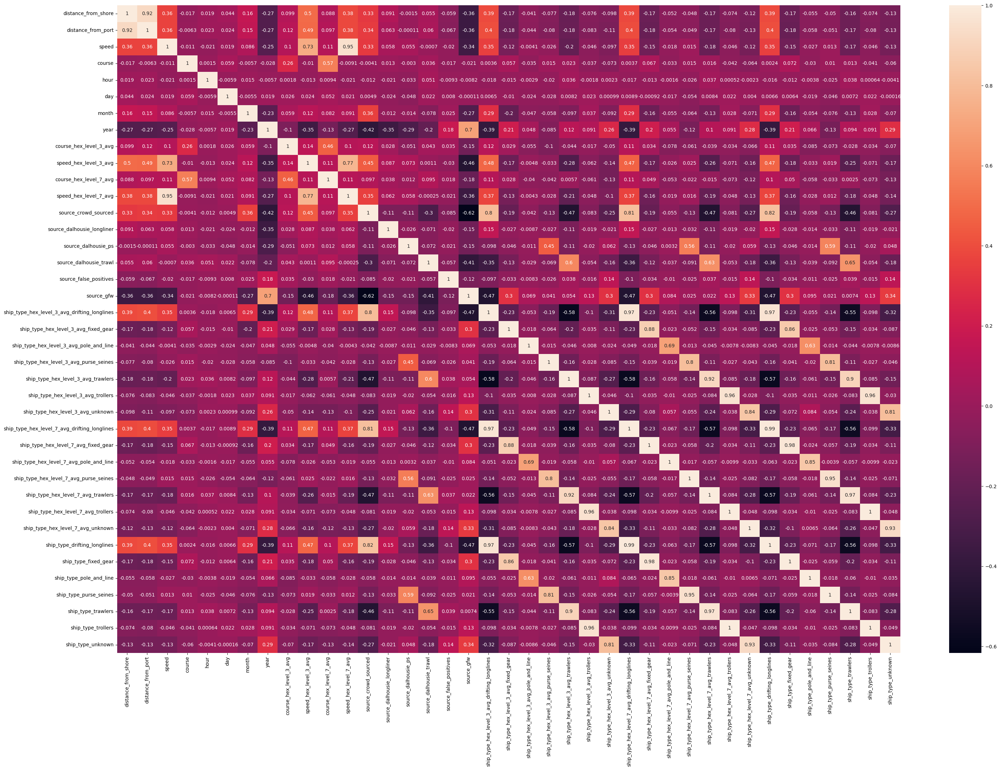

In [27]:
plt.figure(figsize=(36, 24))
sns.heatmap(X_train.corr(),annot=True)

<Axes: >

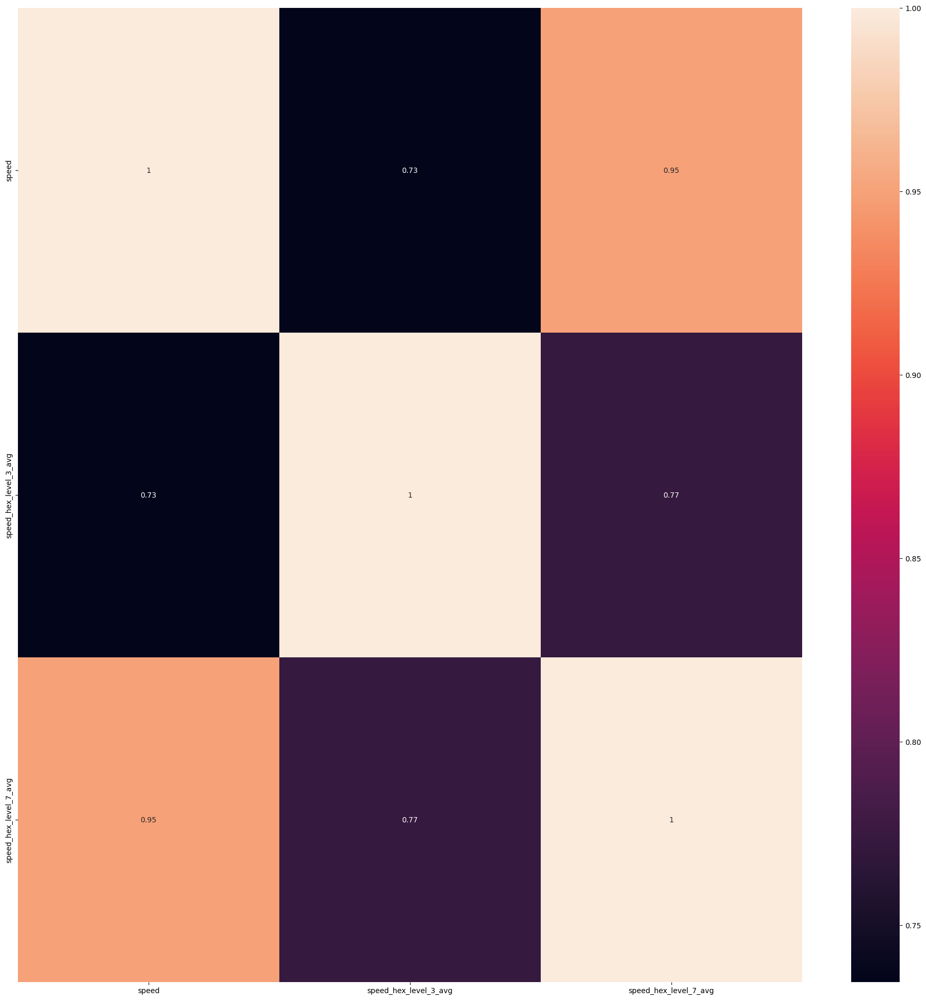

In [31]:
plt.figure(figsize=(24, 24))
sns.heatmap(X_train[['speed','speed_hex_level_3_avg','speed_hex_level_7_avg']].corr(),annot=True)


<Axes: >

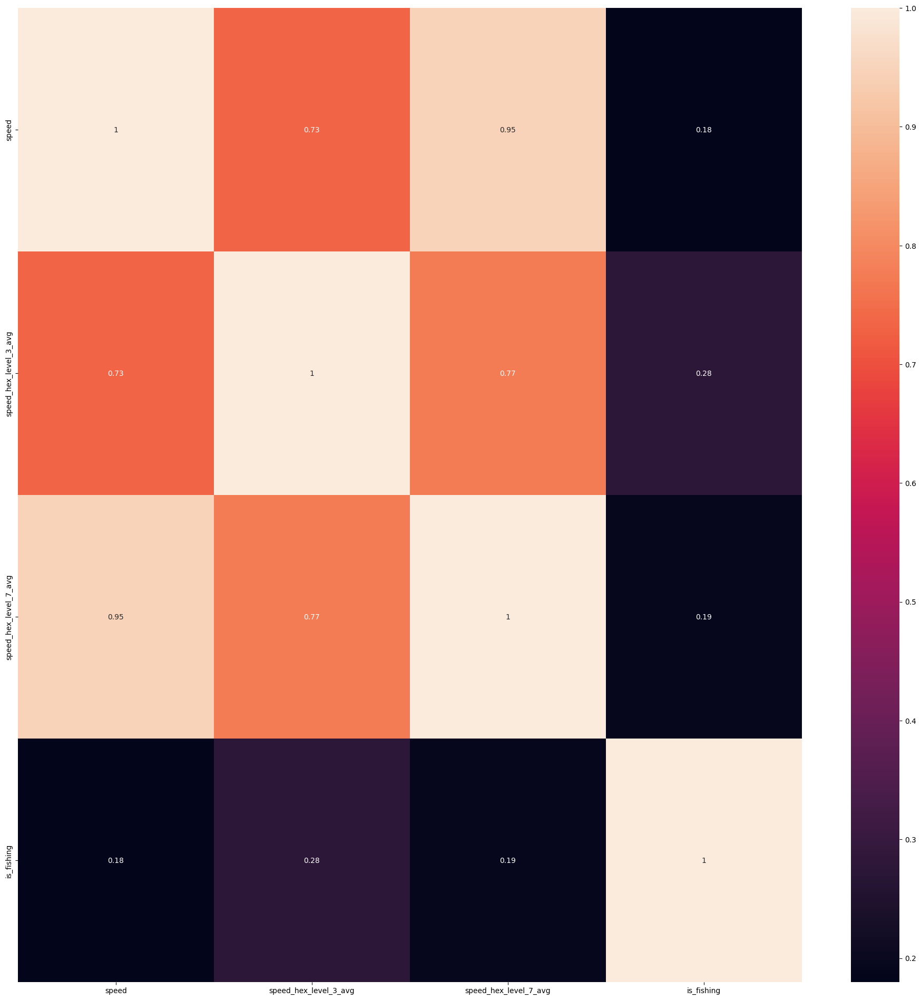

In [33]:
plt.figure(figsize=(24, 24))
sns.heatmap(data[['speed','speed_hex_level_3_avg','speed_hex_level_7_avg','is_fishing']].corr(),annot=True)


## 
•⁠  ⁠gemi tipi bazlı modellerde: all model’in diğer alt gemi modellerinde değerlendirilmesi. (data_tipi eklenecek.)

•⁠  ⁠⁠hexagon bazında modelimiz var, burada target hexagon seviyesinde belli bir threshold değerinin üstüne is_fishing 1 olarak dönülecek

•⁠  ⁠⁠hexagon seviyesinde model değerlendirmede hexagon seviyesinde fishing yapılıp yapılmadığı bilgisi, hexagon seviyesinde geliştirilen model ile 
gemi seviyesinde geliştirilen modelin sonuçlarıın değerlendirilmesi. 

•⁠  ⁠⁠değişkenlerin importance değerlendirilmesi 

•⁠  ⁠⁠hexagon ve gemi tipine göre decision tree visualisation

•⁠  ⁠⁠gemi tipi bazında farklı modelleri denedik. Sonuca göre model verisinin biraz fiktif olabileceğini fark ettik.

•⁠  ⁠⁠spatial correlation control


### Hexagon Models

In [3]:
data_hexagon_7 = pd.read_csv('global_fishing_data_1.csv').drop('Unnamed: 0',axis=1)

In [4]:
data_hexagon_7['timestamp'] = pd.to_datetime(data_hexagon_7['timestamp'])

In [5]:
data_hexagon_7['quarter'] = data_hexagon_7['timestamp'].dt.quarter

In [6]:
data_hexagon_7.set_index('mmsi',inplace=True)
data_hexagon_7 = data_hexagon_7.query('is_fishing == 0 or is_fishing == 1')
data_hexagon_7.drop(['timestamp',
           'hexagon_coordi_7_3','is_fishing_hex_level_3_avg','course_hex_level_3_avg', 'speed_hex_level_3_avg','ship_type_hex_level_3_avg',
           'lat','lon'],axis=1,inplace=True)


In [7]:
data_hexagon_7.select_dtypes('object')

,source,ship_type,hexagon_coordi_7,ship_type_hex_level_7_avg
mmsi,,,,
1.252340e+12,gfw,trawlers,87196820affffff,trawlers
1.252340e+12,gfw,trawlers,87196820affffff,trawlers
1.252340e+12,gfw,trawlers,87196820affffff,trawlers
1.252340e+12,gfw,trawlers,87196820affffff,trawlers
1.252340e+12,gfw,trawlers,87196820affffff,trawlers
...,...,...,...,...
4.393595e+13,crowd_sourced,purse_seines,877ee49b0ffffff,purse_seines
4.393595e+13,crowd_sourced,purse_seines,877e2b2b3ffffff,purse_seines
4.393595e+13,crowd_sourced,purse_seines,877e2b296ffffff,purse_seines


In [8]:
continous_columns_hexagon_level_7 = ['is_fishing','distance_from_shore', 'distance_from_port', 'speed', 'course']
categorical_columns_hexagon_level_7 = ['source','ship_type']

In [9]:
hexagon_level_7_continous_col_avg_dict = {}
for col in continous_columns_hexagon_level_7:
    hexagon_level_7_continous_col_avg_dict[col] = data_hexagon_7.groupby('hexagon_coordi_7')[[col]].mean().reset_index()

In [10]:
def get_pandas_mode(series):
    return series.mode().iloc[0] if not series.mode().empty else None
# Corrected groupby and aggregation
categorical_features_aggregated_hexagon_7 = data_hexagon_7.groupby('hexagon_coordi_7')[['source','ship_type']].agg({'source': get_pandas_mode,'ship_type': get_pandas_mode})


In [15]:
from functools import reduce

In [12]:
dfs = list(hexagon_level_7_continous_col_avg_dict.values())

# Merge all DataFrames on 'hexagon_coordi_7' using reduce
contionus_features_aggregated_hexagon_7 = reduce(lambda left, right: pd.merge(left, right, on='hexagon_coordi_7'), dfs)


In [13]:
categorical_features_aggregated_hexagon_7.reset_index(inplace=True)

In [14]:
# Group by hexagon and quarter, then count observations
quarterly_counts = data_hexagon_7.groupby(['hexagon_coordi_7', 'quarter']).size().unstack(fill_value=0)

# Rename columns to reflect the quarter for clarity
quarterly_counts.columns = [f'# of Observ. in Q{col}' for col in quarterly_counts.columns]

# Group by hexagon and month, then count observations
monthly_counts = data_hexagon_7.groupby(['hexagon_coordi_7', 'month']).size().unstack(fill_value=0)

# Rename columns to reflect the month for clarity
month_labels = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
                7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
monthly_counts.columns = [f'# of Observ. in {month_labels[col]}' for col in monthly_counts.columns]


In [15]:
quarterly_counts.reset_index(inplace=True)
monthly_counts.reset_index(inplace=True)

In [16]:
hexagon_7_level_features_df =categorical_features_aggregated_hexagon_7.merge(contionus_features_aggregated_hexagon_7,how='left',on='hexagon_coordi_7')

In [17]:
hexagon_7_level_features_df = hexagon_7_level_features_df.merge(quarterly_counts,how='left',on='hexagon_coordi_7')
hexagon_7_level_features_df = hexagon_7_level_features_df.merge(monthly_counts,how='left',on='hexagon_coordi_7')

In [18]:
pwd

'/Users/ahmetyuksel/Desktop/IE/SpatioTemporalAnalysis/Global_Fishing/Data'

In [19]:
hexagon_7_level_features_df = pd.get_dummies(hexagon_7_level_features_df, columns=categorical_columns_hexagon_level_7)

In [20]:
hexagon_7_level_features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116667 entries, 0 to 116666
Data columns (total 35 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   hexagon_coordi_7              116667 non-null  object 
 1   is_fishing                    116667 non-null  float64
 2   distance_from_shore           116667 non-null  float64
 3   distance_from_port            116667 non-null  float64
 4   speed                         116666 non-null  float64
 5   course                        116666 non-null  float64
 6   # of Observ. in Q1            116667 non-null  int64  
 7   # of Observ. in Q2            116667 non-null  int64  
 8   # of Observ. in Q3            116667 non-null  int64  
 9   # of Observ. in Q4            116667 non-null  int64  
 10  # of Observ. in Jan           116667 non-null  int64  
 11  # of Observ. in Feb           116667 non-null  int64  
 12  # of Observ. in Mar           116667 non-nul

In [21]:
hexagon_7_level_features_df.to_csv('hexagon_7_level_aggregated_features.csv')

In [22]:
hexagon_7_level_features_df.set_index('hexagon_coordi_7',inplace=True)

In [23]:
hexagon_7_level_features_df['is_fishing'].describe([0.1,0.25,0.5,0.75,0.8,0.9,0.95,0.99,0.9995])

count     116667.000000
mean           0.561244
std            0.488319
min            0.000000
10%            0.000000
25%            0.000000
50%            1.000000
75%            1.000000
80%            1.000000
90%            1.000000
95%            1.000000
99%            1.000000
99.95%         1.000000
max            1.000000
Name: is_fishing, dtype: float64

In [25]:
hexagon_7_level_features_df['is_fishing'].value_counts().head(10)

is_fishing
1.000000    62760
0.000000    49194
0.500000     1148
0.666667      497
0.333333      350
0.750000      279
0.800000      152
0.833333      135
0.250000      135
0.600000      127
Name: count, dtype: int64

In [24]:
hexagon_7_level_features_df['is_fishing'] = (hexagon_7_level_features_df['is_fishing']>0.65)*1

In [25]:
hexagon_7_level_features_df['is_fishing'].value_counts().head(10)

is_fishing
1    64816
0    51851
Name: count, dtype: int64

In [26]:
X_hexagon_7 = hexagon_7_level_features_df.drop(target_col, axis=1)
y_hexagon_7 = hexagon_7_level_features_df[target_col]

In [27]:
X_hexagon_7

,distance_from_shore,distance_from_port,speed,course,# of Observ. in Q1,# of Observ. in Q2,# of Observ. in Q3,# of Observ. in Q4,# of Observ. in Jan,# of Observ. in Feb,...,source_dalhousie_trawl,source_false_positives,source_gfw,ship_type_drifting_longlines,ship_type_fixed_gear,ship_type_pole_and_line,ship_type_purse_seines,ship_type_trawlers,ship_type_trollers,ship_type_unknown
hexagon_coordi_7,,,,,,,,,,,,,,,,,,,,,
87000420bffffff,558546.062500,2.194947e+06,3.9,75.099998,0,0,0,1,0,0,...,True,False,False,False,False,False,False,True,False,False
870004235ffffff,584405.062500,2.188492e+06,12.4,268.799988,0,0,0,1,0,0,...,True,False,False,False,False,False,False,True,False,False
8700042a3ffffff,645468.500000,2.265147e+06,4.1,186.699997,0,0,0,1,0,0,...,True,False,False,False,False,False,False,True,False,False
8700042d4ffffff,615401.812500,2.257031e+06,3.9,114.900002,0,0,0,1,0,0,...,True,False,False,False,False,False,False,True,False,False
8700042f3ffffff,609524.250000,2.251093e+06,4.1,82.099998,0,0,0,1,0,0,...,True,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87dab6244ffffff,186210.359375,2.023536e+05,10.3,4.200000,1,0,0,0,1,0,...,False,False,True,False,False,False,False,True,False,False
87dab6246ffffff,184226.312500,2.003797e+05,9.9,7.100000,1,0,0,0,1,0,...,False,False,True,False,False,False,False,True,False,False
87dab6251ffffff,182722.093750,1.988770e+05,9.8,357.700012,1,0,0,0,1,0,...,False,False,True,False,False,False,False,True,False,False


In [28]:
rf_params = {'n_estimators': 500, 'max_depth': 5, 'random_state': 2024}
hexagon_7_level_features_df
X_train, X_test, y_train, y_test = train_test_split(X_hexagon_7, y_hexagon_7, test_size=0.2, random_state=42)

model_hexagon_7 = RandomForestClassifier(**rf_params)
model_hexagon_7.fit(X_train, y_train)


RandomForestClassifier(max_depth=5, n_estimators=500, random_state=2024)

In [29]:
test_predictions = model_hexagon_7.predict(X_test)
test_probs = model_hexagon_7.predict_proba(X_test)[:, 1]  # probabilities for ROC AUC

# Predictions for training set
train_predictions = model_hexagon_7.predict(X_train)
train_probs = model_hexagon_7.predict_proba(X_train)[:, 1]  # probabilities for ROC AUC

# Store results for both training and test sets
results_data_hexagon = {
    'train_accuracy': accuracy_score(y_train, train_predictions),
    'test_accuracy': accuracy_score(y_test, test_predictions),
    'train_precision': precision_score(y_train, train_predictions),
    'test_precision': precision_score(y_test, test_predictions),
    'train_recall': recall_score(y_train, train_predictions),
    'test_recall': recall_score(y_test, test_predictions),
    'train_f1_score': f1_score(y_train, train_predictions),     
    'test_f1_score': f1_score(y_test, test_predictions),
    'test_roc_auc': roc_auc_score(y_test, test_probs),
    'train_roc_auc': roc_auc_score(y_train, train_probs),   
}

# Convert results dictionary to DataFrame
#df_results_hexagons = pd.DataFrame.from_dict(results_data_hexagon, orient='index')

In [30]:
X_test['Pred'] = test_predictions
X_train['Pred'] = train_predictions

In [31]:
hexagon_7_predictions = pd.concat([X_train[['Pred']],X_test[['Pred']]])

In [32]:
print(f'Number of Rows {hexagon_7_level_features_df.shape[0]}, Number of Columns: {hexagon_7_level_features_df.shape[1]}')
df_results_hexagons

Number of Rows 116667, Number of Columns: 34


NameError: name 'df_results_hexagons' is not defined

In [ ]:


feature_names = X_train.columns
importances = model_hexagon_7.feature_importances_

# Store in a dictionary with ship as the key and another dictionary mapping feature names to their importances
feature_importances_hexagon = dict(zip(feature_names, importances))

# Now, create a DataFrame from the dictionary of dictionaries
# This approach handles the variable feature count by aligning names and importances correctly
feature_importances_hexagon = pd.DataFrame.from_dict(feature_importances_hexagon, orient='index')

In [ ]:
feature_importances_hexagon = feature_importances_hexagon.sort_values(0,ascending=True)

In [ ]:
feature_importances_hexagon.reset_index(inplace=True)


In [ ]:
feature_importances_hexagon.columns = ['Feature','Feature Importances']

Text(0, 0.5, 'Features')

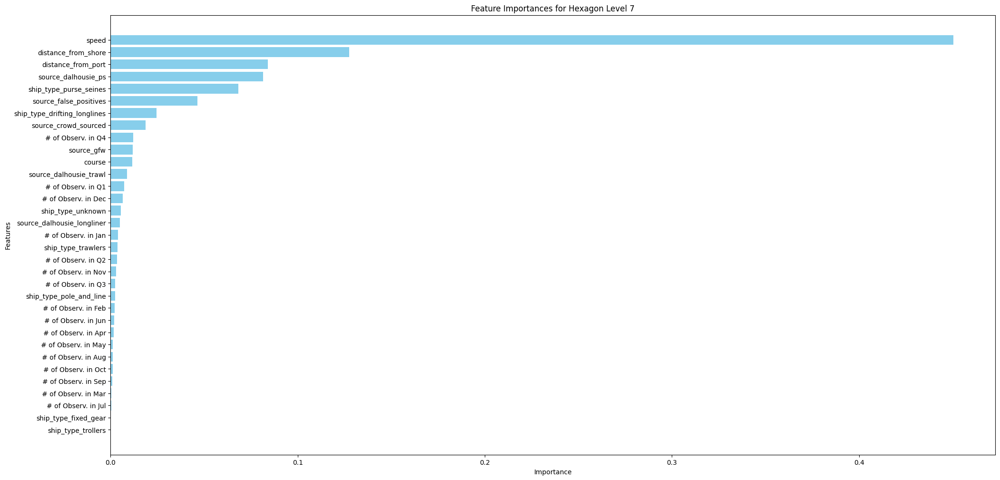

In [196]:

plt.figure(figsize=(24, 12))
plt.barh(feature_importances_hexagon['Feature'], feature_importances_hexagon['Feature Importances'], color='skyblue')
plt.title(f'Feature Importances for Hexagon Level 7')
plt.xlabel('Importance')
plt.ylabel('Features')

# Save the figure to the output directory
#plt.savefig(os.path.join(output_dir, f'Feature_Importances_{ship}.png'))
#plt.close()  # Close the plot to free up memoryi

In [ ]:
### Excel'e Eklenilecek

In [208]:



from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Select a tree, e.g., the first tree
tree = model_hexagon_7.estimators_[0]
feature_names=hexagon_7_level_features_df.drop(target_col,axis=1).columns

plt.figure(figsize=(120,80))
plot_tree(tree, filled=True, feature_names=hexagon_7_level_features_df.drop(target_col,axis=1).columns, class_names=['0','1'])
plt.show()



In [ ]:
### Hexagon Level 3 

In [36]:
data_hexagon_3 = pd.read_csv('global_fishing_data_1.csv').drop('Unnamed: 0',axis=1)

In [37]:
data_hexagon_3.rename(columns={'hexagon_coordi_7_3':'hexagon_coordi_3'},inplace=True)

In [38]:
data_hexagon_3.columns

Index(['mmsi', 'timestamp', 'distance_from_shore', 'distance_from_port',
       'speed', 'course', 'lat', 'lon', 'is_fishing', 'source', 'ship_type',
       'hour', 'day', 'month', 'year', 'hexagon_coordi_7', 'hexagon_coordi_3',
       'course_hex_level_3_avg', 'is_fishing_hex_level_3_avg',
       'ship_type_hex_level_3_avg', 'speed_hex_level_3_avg',
       'course_hex_level_7_avg', 'is_fishing_hex_level_7_avg',
       'ship_type_hex_level_7_avg', 'speed_hex_level_7_avg'],
      dtype='object')

In [39]:

data_hexagon_3['timestamp'] = pd.to_datetime(data_hexagon_3['timestamp'])
data_hexagon_3['quarter'] = data_hexagon_3['timestamp'].dt.quarter
data_hexagon_3.set_index('mmsi',inplace=True)
data_hexagon_3 = data_hexagon_3.query('is_fishing == 0 or is_fishing == 1')
data_hexagon_3.drop(['timestamp','hexagon_coordi_7',
           'is_fishing_hex_level_7_avg','course_hex_level_7_avg', 'speed_hex_level_7_avg','ship_type_hex_level_7_avg',
           'lat','lon'],axis=1,inplace=True)



In [40]:
data_hexagon_3.select_dtypes('object')
continous_columns_hexagon_level_3 = ['is_fishing','distance_from_shore', 'distance_from_port', 'speed', 'course']
categorical_columns_hexagon_level_3 = ['source','ship_type']
hexagon_level_3_continous_col_avg_dict = {}

In [41]:
data_hexagon_3.columns

Index(['distance_from_shore', 'distance_from_port', 'speed', 'course',
       'is_fishing', 'source', 'ship_type', 'hour', 'day', 'month', 'year',
       'hexagon_coordi_3', 'course_hex_level_3_avg',
       'is_fishing_hex_level_3_avg', 'ship_type_hex_level_3_avg',
       'speed_hex_level_3_avg', 'quarter'],
      dtype='object')

In [42]:

for col in continous_columns_hexagon_level_3:
    hexagon_level_3_continous_col_avg_dict[col] = data_hexagon_3.groupby('hexagon_coordi_3')[[col]].mean().reset_index()

In [43]:

def get_pandas_mode(series):
    return series.mode().iloc[0] if not series.mode().empty else None
# Corrected groupby and aggregation
categorical_features_aggregated_hexagon_3 = data_hexagon_3.groupby('hexagon_coordi_3')[['source','ship_type']].agg({'source': get_pandas_mode,'ship_type': get_pandas_mode})

from functools import reduce
dfs = list(hexagon_level_3_continous_col_avg_dict.values())

# Merge all DataFrames on 'hexagon_coordi_3' using reduce
contionus_features_aggregated_hexagon_3 = reduce(lambda left, right: pd.merge(left, right, on='hexagon_coordi_3'), dfs)

In [44]:


categorical_features_aggregated_hexagon_3.reset_index(inplace=True)
# Group by hexagon and quarter, then count observations
quarterly_counts = data_hexagon_3.groupby(['hexagon_coordi_3', 'quarter']).size().unstack(fill_value=0)

# Rename columns to reflect the quarter for clarity
quarterly_counts.columns = [f'# of Observ. in Q{col}' for col in quarterly_counts.columns]

# Group by hexagon and month, then count observations
monthly_counts = data_hexagon_3.groupby(['hexagon_coordi_3', 'month']).size().unstack(fill_value=0)

# Rename columns to reflect the month for clarity
month_labels = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
                7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
monthly_counts.columns = [f'# of Observ. in {month_labels[col]}' for col in monthly_counts.columns]

quarterly_counts.reset_index(inplace=True)
monthly_counts.reset_index(inplace=True)
hexagon_3_level_features_df =categorical_features_aggregated_hexagon_3.merge(contionus_features_aggregated_hexagon_3,how='left',on='hexagon_coordi_3')
hexagon_3_level_features_df = hexagon_3_level_features_df.merge(quarterly_counts,how='left',on='hexagon_coordi_3')
hexagon_3_level_features_df = hexagon_3_level_features_df.merge(monthly_counts,how='left',on='hexagon_coordi_3')


hexagon_3_level_features_df = pd.get_dummies(hexagon_3_level_features_df, columns=categorical_columns_hexagon_level_3)
hexagon_3_level_features_df.info()
hexagon_3_level_features_df.to_csv('hexagon_3_level_aggregated_features.csv')
hexagon_3_level_features_df.set_index('hexagon_coordi_3',inplace=True)
hexagon_3_level_features_df['is_fishing'].describe([0.1,0.25,0.5,0.75,0.8,0.9,0.95,0.99,0.9995])
hexagon_3_level_features_df['is_fishing'].value_counts().head(10)
hexagon_3_level_features_df['is_fishing'] = (hexagon_3_level_features_df['is_fishing']>0.65)*1
hexagon_3_level_features_df['is_fishing'].value_counts().head(10)
X_hexagon_3 = hexagon_3_level_features_df.drop(target_col, axis=1)
y_hexagon_3 = hexagon_3_level_features_df[target_col]
X_hexagon_3
rf_params = {'n_estimators': 500, 'max_depth': 5, 'random_state': 2024}
hexagon_3_level_features_df
X_train, X_test, y_train, y_test = train_test_split(X_hexagon_3, y_hexagon_3, test_size=0.2, random_state=42)

model_hexagon_3 = RandomForestClassifier(**rf_params)
model_hexagon_3.fit(X_train, y_train)

test_predictions = model_hexagon_3.predict(X_test)
test_probs = model_hexagon_3.predict_proba(X_test)[:, 1]  # probabilities for ROC AUC

# Predictions for training set
train_predictions = model_hexagon_3.predict(X_train)
train_probs = model_hexagon_3.predict_proba(X_train)[:, 1]  # probabilities for ROC AUC

# Store results for both training and test sets
results_data_hexagon = {
    'train_accuracy': accuracy_score(y_train, train_predictions),
    'test_accuracy': accuracy_score(y_test, test_predictions),
    'train_precision': precision_score(y_train, train_predictions),
    'test_precision': precision_score(y_test, test_predictions),
    'train_recall': recall_score(y_train, train_predictions),
    'test_recall': recall_score(y_test, test_predictions),
    'train_f1_score': f1_score(y_train, train_predictions),     
    'test_f1_score': f1_score(y_test, test_predictions),
    'test_roc_auc': roc_auc_score(y_test, test_probs),
    'train_roc_auc': roc_auc_score(y_train, train_probs),   
}

# Convert results dictionary to DataFrame
#df_results_hexagons = pd.DataFrame.from_dict(results_data_hexagon, orient='index')
X_test['Pred'] = test_predictions
X_train['Pred'] = train_predictions
hexagon_3_predictions = pd.concat([X_train[['Pred']],X_test[['Pred']]])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4713 entries, 0 to 4712
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   hexagon_coordi_3              4713 non-null   object 
 1   is_fishing                    4713 non-null   float64
 2   distance_from_shore           4713 non-null   float64
 3   distance_from_port            4713 non-null   float64
 4   speed                         4713 non-null   float64
 5   course                        4713 non-null   float64
 6   # of Observ. in Q1            4713 non-null   int64  
 7   # of Observ. in Q2            4713 non-null   int64  
 8   # of Observ. in Q3            4713 non-null   int64  
 9   # of Observ. in Q4            4713 non-null   int64  
 10  # of Observ. in Jan           4713 non-null   int64  
 11  # of Observ. in Feb           4713 non-null   int64  
 12  # of Observ. in Mar           4713 non-null   int64  
 13  # o

In [45]:
hexagon_3_predictions.to_csv('Hexagon_3_Predictions.csv')

In [46]:
data.shape

NameError: name 'data' is not defined

In [47]:
hexagon_3_predictions = hexagon_3_predictions.reset_index()

In [48]:
hexagon_3_predictions.columns = ['hexagon_coordi_3','Hexagon_3_Pred']

In [49]:
hexagon_7_predictions.columns = ['Hexagon_7_Pred']

In [50]:
hexagon_7_predictions.reset_index(inplace=True)

In [51]:
hexagon_7_predictions

,hexagon_coordi_7,Hexagon_7_Pred
0,87096151affffff,1
1,871f2502bffffff,0
2,8755ae172ffffff,1
3,8776232e9ffffff,1
4,8755a680dffffff,0
...,...,...
116662,877f29025ffffff,1
116663,87346c79cffffff,0
116664,873b71786ffffff,1
116665,878e34b69ffffff,0


In [52]:
data = pd.read_csv('global_fishing_data_1.csv').drop('Unnamed: 0',axis=1)
#data.set_index('mmsi',inplace=True)
data = data.query('is_fishing == 0 or is_fishing == 1')

In [54]:
data.head()

,mmsi,timestamp,distance_from_shore,distance_from_port,speed,course,lat,lon,is_fishing,source,...,hexagon_coordi_7,hexagon_coordi_7_3,course_hex_level_3_avg,is_fishing_hex_level_3_avg,ship_type_hex_level_3_avg,speed_hex_level_3_avg,course_hex_level_7_avg,is_fishing_hex_level_7_avg,ship_type_hex_level_7_avg,speed_hex_level_7_avg
0,1.252340e+12,2015-01-01 05:08:23,0.0,0.0,0.0,128.0,52.458717,4.581316,0.0,gfw,...,87196820affffff,831968fffffffff,120.599998,0.001737,trawlers,0.358636,120.599998,0.0,trawlers,0.007767
1,1.252340e+12,2015-01-01 05:20:34,0.0,0.0,0.0,128.0,52.458733,4.581316,0.0,gfw,...,87196820affffff,831968fffffffff,120.599998,0.001737,trawlers,0.358636,120.599998,0.0,trawlers,0.007767
2,1.252340e+12,2015-01-01 05:32:53,0.0,0.0,0.0,128.0,52.458698,4.581267,0.0,gfw,...,87196820affffff,831968fffffffff,120.599998,0.001737,trawlers,0.358636,120.599998,0.0,trawlers,0.007767
3,1.252340e+12,2015-01-01 05:45:23,0.0,0.0,0.0,128.0,52.458698,4.581234,0.0,gfw,...,87196820affffff,831968fffffffff,120.599998,0.001737,trawlers,0.358636,120.599998,0.0,trawlers,0.007767
4,1.252340e+12,2015-01-01 05:57:24,0.0,0.0,0.0,128.0,52.458683,4.581183,0.0,gfw,...,87196820affffff,831968fffffffff,120.599998,0.001737,trawlers,0.358636,120.599998,0.0,trawlers,0.007767


In [55]:
data.rename(columns={'hexagon_coordi_7_3':'hexagon_coordi_3'},inplace=True)

In [56]:
hexagon_3_predictions

,hexagon_coordi_3,Hexagon_3_Pred
0,838e00fffffffff,0
1,837f85fffffffff,0
2,83bbadfffffffff,1
3,8319b0fffffffff,0
4,836c65fffffffff,0
...,...,...
4708,830659fffffffff,0
4709,83ce2afffffffff,0
4710,837571fffffffff,0
4711,83012afffffffff,0


In [57]:
data = data.merge(hexagon_3_predictions,how='left',on='hexagon_coordi_3')

In [58]:
data = data.merge(hexagon_7_predictions,how='left',on='hexagon_coordi_7')

In [59]:
predictions_df = data[['mmsi','is_fishing','Hexagon_3_Pred','Hexagon_7_Pred']]

In [60]:
predictions_df.to_excel('predictions_df_hex_3_and_7_true_label.xlsx')

In [61]:
predictions_df.head()

,mmsi,is_fishing,Hexagon_3_Pred,Hexagon_7_Pred
0,1.252340e+12,0.0,0,0
1,1.252340e+12,0.0,0,0
2,1.252340e+12,0.0,0,0
3,1.252340e+12,0.0,0,0
4,1.252340e+12,0.0,0,0


In [64]:
import gc
gc.collect()

0

In [65]:
data_ship = pd.read_csv('global_fishing_data_1.csv').drop('Unnamed: 0',axis=1)
data_ship.set_index('mmsi',inplace=True)
data_ship = data_ship.query('is_fishing == 0 or is_fishing == 1')

data_ship.drop(['timestamp','hexagon_coordi_7','hexagon_coordi_7_3','is_fishing_hex_level_3_avg','is_fishing_hex_level_7_avg','lat','lon'],axis=1,inplace=True)

In [66]:
categorical_columns = ['source','ship_type_hex_level_3_avg','ship_type_hex_level_7_avg','ship_type'] #ship_type ommitted for experiment
data_ship = pd.get_dummies(data_ship, columns=categorical_columns)

In [67]:
import gc
gc.collect()

3

In [68]:
rf_params = {'n_estimators': 500, 'max_depth': 5, 'random_state': 2024}


X = data_ship.drop(target_col, axis=1)
y = data_ship[target_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestClassifier(**rf_params)
model.fit(X_train, y_train)




# Predictions for test set
X_test['Pred_Ship_Based'] = model.predict(X_test)


# Predictions for training set
X_train['Pred_Ship_Based'] = model.predict(X_train)





In [70]:
X_train.head(1)

,distance_from_shore,distance_from_port,speed,course,hour,day,month,year,course_hex_level_3_avg,speed_hex_level_3_avg,...,ship_type_hex_level_7_avg_trollers,ship_type_hex_level_7_avg_unknown,ship_type_drifting_longlines,ship_type_fixed_gear,ship_type_pole_and_line,ship_type_purse_seines,ship_type_trawlers,ship_type_trollers,ship_type_unknown,Pred_Ship_Based
mmsi,,,,,,,,,,,,,,,,,,,,,
2.774583e+14,12727.610352,86831.046875,7.5,74.099998,4,26,2,2015,30.0,4.162824,...,False,False,True,False,False,False,False,False,False,0.0


In [71]:
ship_based_preds = pd.concat([X_train[['Pred_Ship_Based']],X_test[['Pred_Ship_Based']]])

In [72]:
ship_based_preds.reset_index(inplace=True)

In [73]:
ship_based_preds.columns = ['mmsi','Pred_Ship_Based']

In [75]:
ship_based_preds.to_excel('Ship_Based_Predictions.xlsx')

In [2]:
import pandas as pd

predictions_df=pd.read_excel('predictions_df_hex_3_and_7_true_label.xlsx')
ship_based_preds=pd.read_excel('Ship_Based_Predictions.xlsx')

In [4]:
import gc
gc.collect()

0

In [5]:
predictions_df.set_index('mmsi',inplace=True)
ship_based_preds.set_index('mmsi',inplace=True)

In [8]:
predictions_df.drop('Unnamed: 0',axis=1,inplace=True)

In [10]:
ship_based_preds.drop('Unnamed: 0',axis=1,inplace=True)

In [12]:
ship_based_preds.head(1)

,Pred_Ship_Based
mmsi,
277458320934593,0


In [17]:
dfs = [predictions_df,ship_based_preds]

In [14]:
import reduce

ModuleNotFoundError: No module named 'reduce'

In [19]:
final_df = reduce(lambda left, right: pd.merge(left, right, on='mmsi'),dfs)

: 

In [427]:
predictions_df = data[['mmsi','is_fishing','Hexagon_3_Pred','Hexagon_7_Pred','Pred_Ship_Based']]

KeyError: "['Pred_Ship_Based'] not in index"